In [1]:
!pip install diffusers
!pip install accelerate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 31.8 MB/s eta 0:00:00


In [2]:
import PIL
import requests
import torch
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
from diffusers.utils import load_image, make_image_grid

model_id = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16, safety_checker=None)
pipe.to("cuda")


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

2024-04-19 06:58:09.407940: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-19 06:58:09.408062: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-19 06:58:09.550677: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/569 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.02k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

StableDiffusionInstructPix2PixPipeline {
  "_class_name": "StableDiffusionInstructPix2PixPipeline",
  "_diffusers_version": "0.27.2",
  "_name_or_path": "timbrooks/instruct-pix2pix",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

/tmp/ipykernel_24/753890844.py:12: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

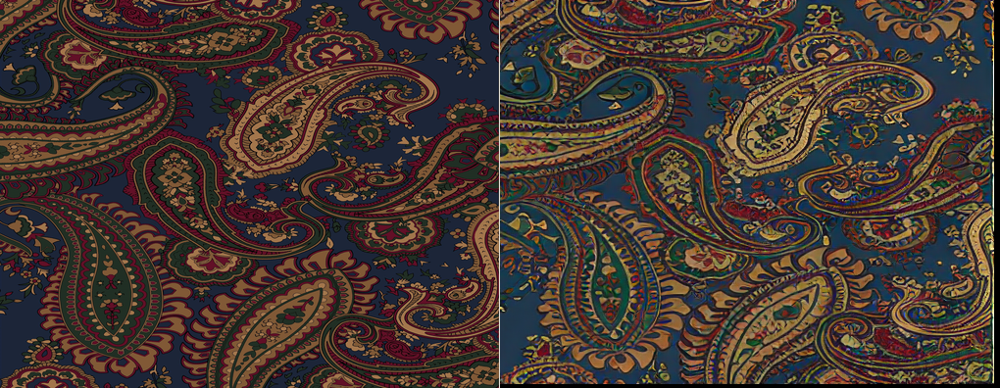

In [3]:
from PIL import Image
import io

image_path = "/kaggle/input/images/PRINT PAGE-CU8439.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."

image = pipe(prompt, image=init_image).images[0]
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/1092264566.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

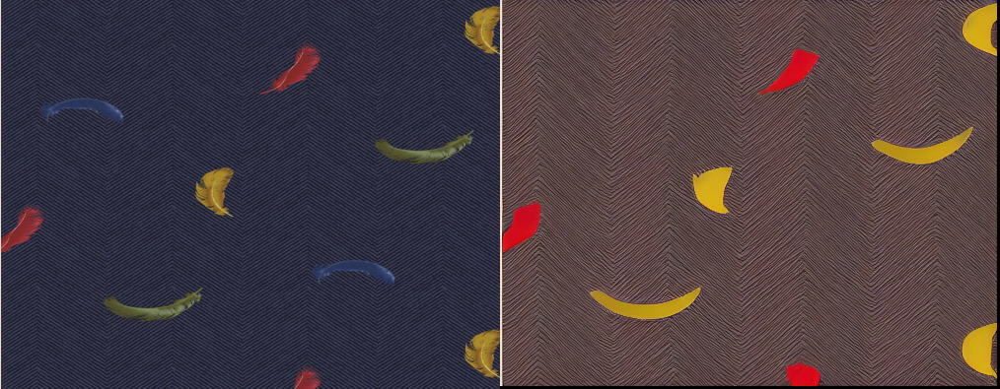

In [4]:

image_path = "/kaggle/input/images/218654.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=1).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)  # One row, four columns

/tmp/ipykernel_24/303020915.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

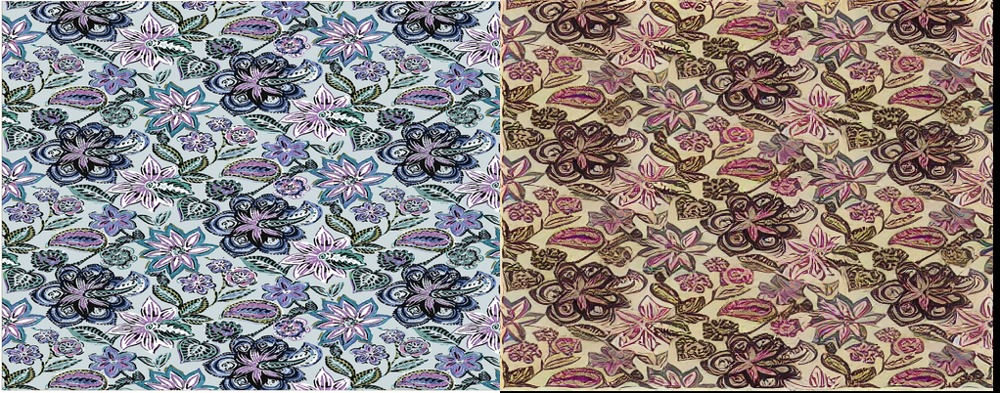

In [5]:
image_path = "/kaggle/input/images/281.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=1).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/1621515997.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

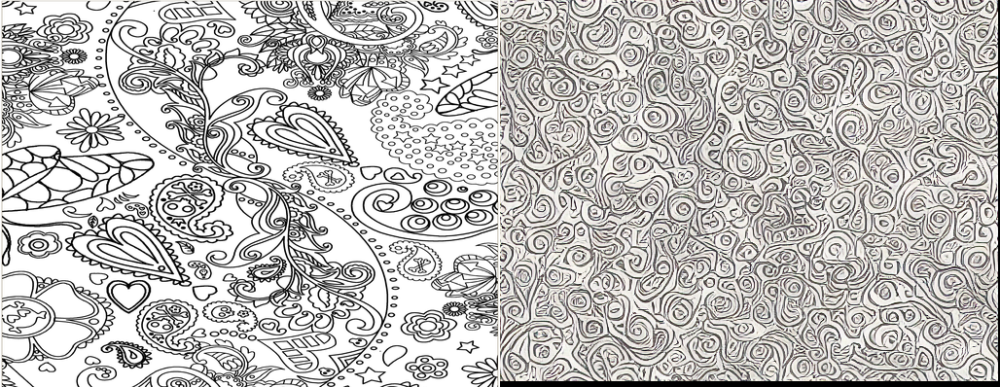

In [6]:
image_path = "/kaggle/input/images/80403031-PP.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=1).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/465470495.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

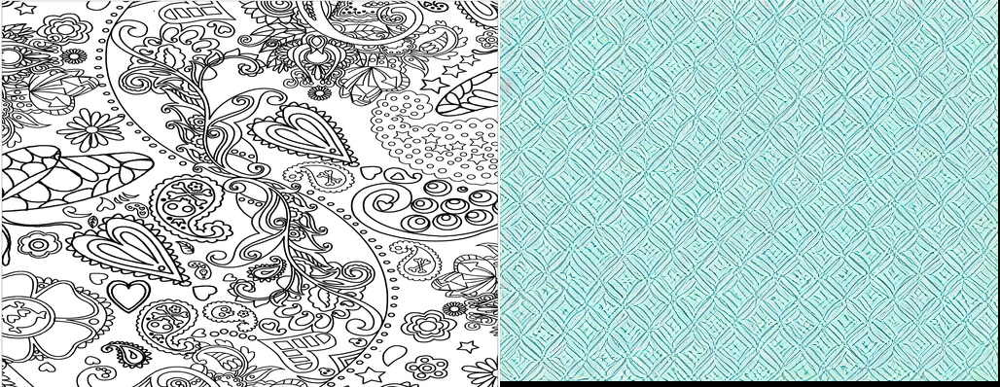

In [7]:
image_path = "/kaggle/input/images/80403031-PP.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=4.5).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/2623667911.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

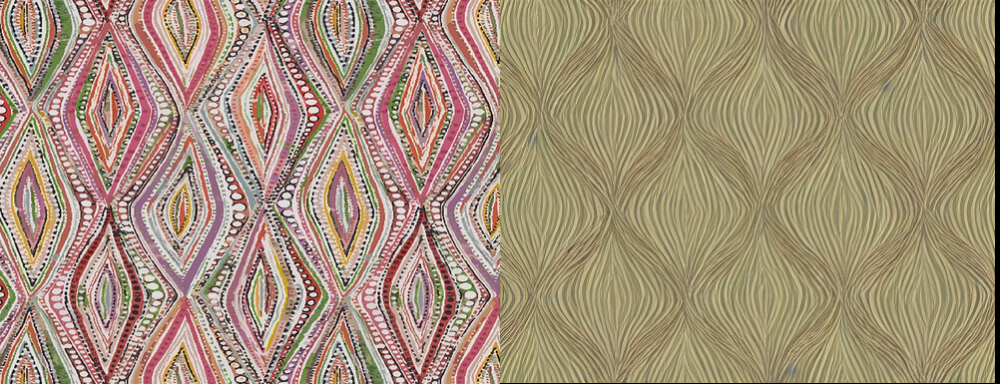

In [8]:
image_path = "/kaggle/input/images/234.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=1).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/1621515997.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

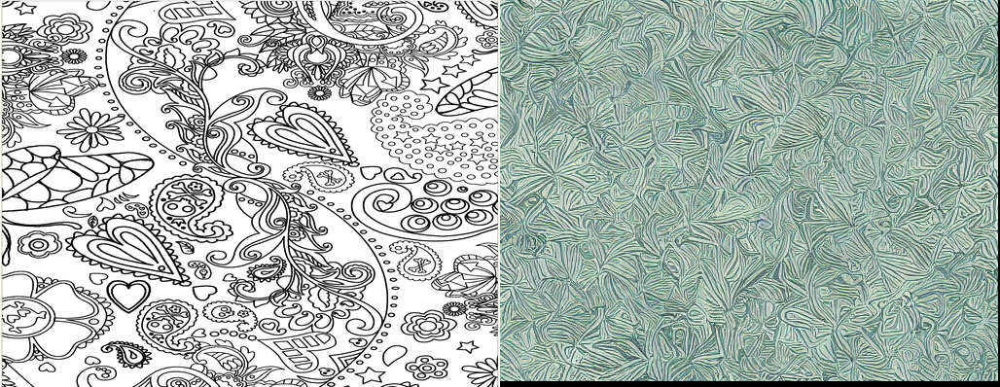

In [9]:
image_path = "/kaggle/input/images/80403031-PP.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=1).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/3249978348.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

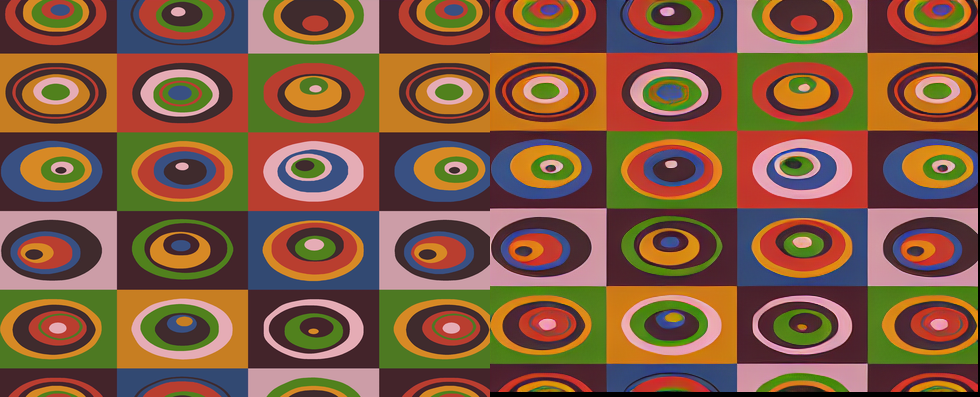

In [10]:
image_path = "/kaggle/input/images/912.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=3).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/1801015670.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

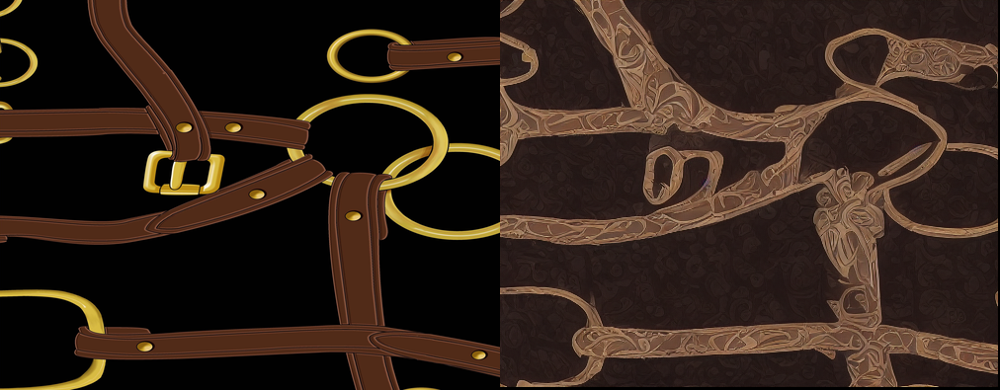

In [11]:
image_path = "/kaggle/input/images/PRINT PAGE-CU8710.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=1).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/239042772.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

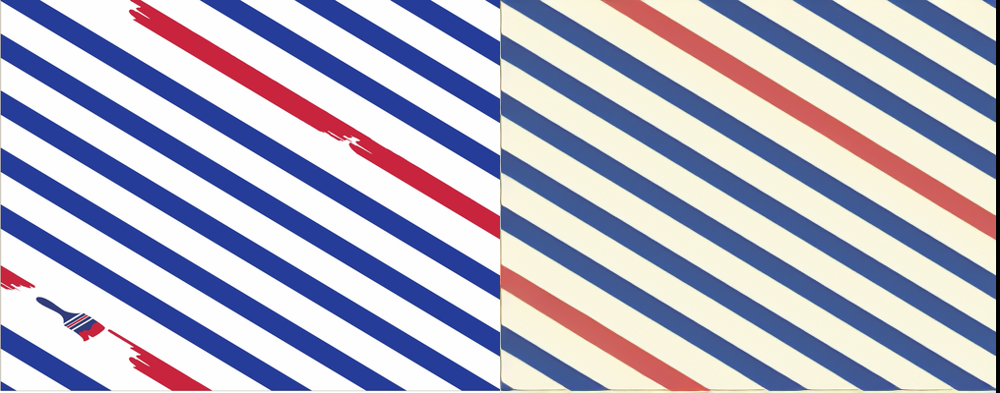

In [12]:
image_path = "/kaggle/input/images/12654.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=1).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/3459542768.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

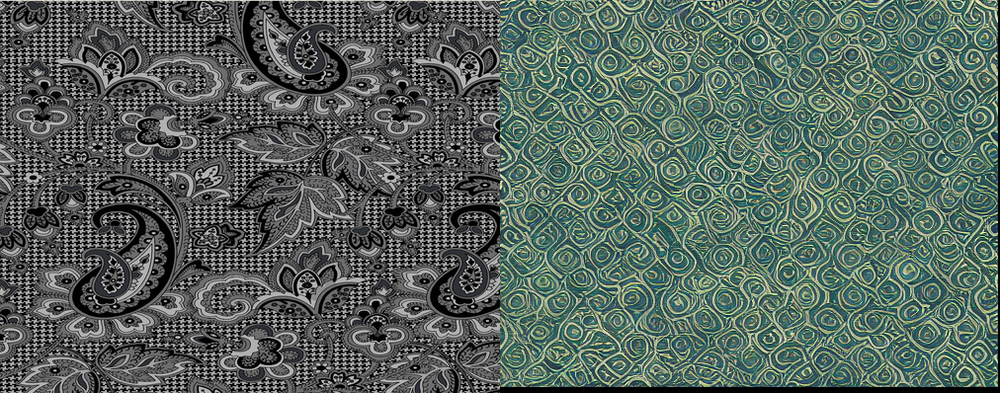

In [13]:
image_path = "/kaggle/input/images/274.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=2).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/2477392374.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

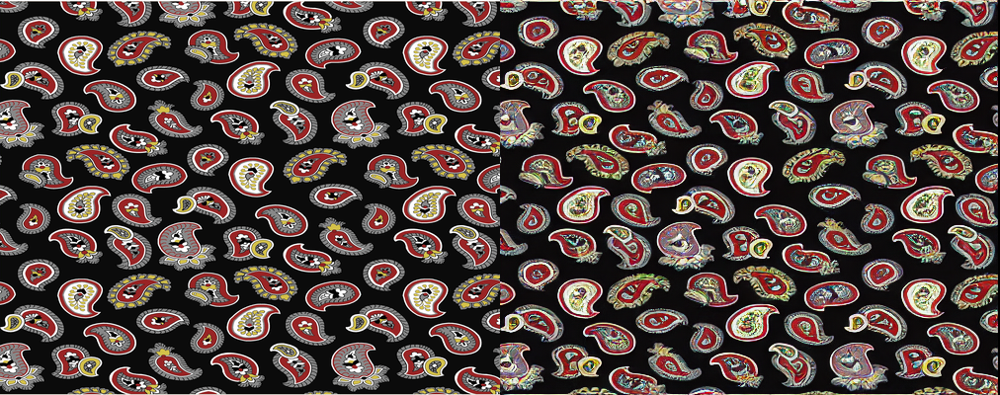

In [14]:
image_path = "/kaggle/input/images/2611.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=2).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)

/tmp/ipykernel_24/508518073.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  init_image = image.resize(new_size, Image.ANTIALIAS)


  0%|          | 0/100 [00:00<?, ?it/s]

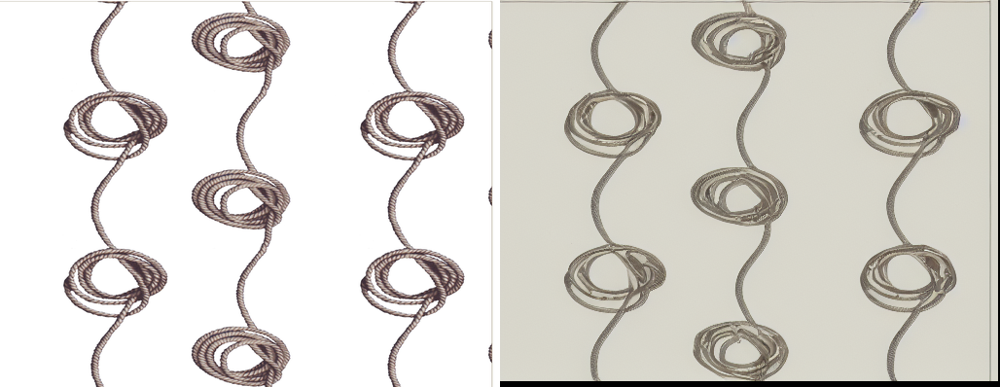

In [15]:
image_path = "/kaggle/input/images/194.jpg"# Update this path

image = Image.open(image_path)

# Specify the new size. For example, to resize to half the original width and height
new_size = (image.width // 6, image.height // 10)

# Resize the image
init_image = image.resize(new_size, Image.ANTIALIAS)

prompt = "Create a new variation of the provided design pattern, capturing the original's artistic style and color scheme. Adapt the design to include new, yet harmonious color combinations, ensuring variant respects the initial pattern's essence and artistic flair. Aim for diversity while maintaining a cohesive link to the original concept."
num_variations = 1
image = pipe(prompt, image=init_image,num_images_per_prompt=num_variations,guidance_scale=1).images[0]
  # Add generated images

# Make the grid
make_image_grid([init_image, image], rows=1, cols=2)